##Подключим данные и необходимые библиотеки

In [ ]:
!pip install phik
!pip install ydata_profiling
!pip install hyperopt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import phik
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso, Ridge
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import StackingRegressor, GradientBoostingRegressor
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
import time
import pickle
from functools import partial

In [ ]:
# Загрузка данных
data_bike = pd.read_csv('https://github.com/sergigusev/Datasets/raw/main/seoul_bike_data.csv', sep=',', encoding='ISO-8859-1')

In [ ]:
display(data_bike)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes


## EDA

###Поверхностный анализ датасета

In [ ]:
data_bike.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


Пропуски в данных не обнаружены. Выбросы тоже

In [ ]:
data_bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

В датасете присутствуют 10 числовых переменных, переменная даты (Date), а также три переменные типа object (Seasons, Holiday, Functioning Day). Поработаем с кодированием

In [ ]:
data_bike.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

Пропущенных значений не обнаружено

In [ ]:
print(f'Количество дубликатов: {data_bike.duplicated().sum()}')

Количество дубликатов: 0


Дубликаты в данных не обнаружены

In [ ]:
# Взглянем поверхностно на данные с помощью профайлера
bike_profile = ProfileReport(data_bike, title="Bike Profiling Report", explorative=True)
bike_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Судя по отчёту видно, что велосипеды не арендовались, когда сервис не работал. Также заметен самый высокий спрос по утрам и вечерам. А также была замечена мультиколлинеарность нескольких переменных. Поверхностный взгляд произведён, применим python для анализа выявленных наблюдений.

In [ ]:
# Переименуем переменные для упрощённой работы с ними
data_bike.rename(columns={
    'Rented Bike Count': 'RBC',
    'Temperature(°C)': 'Temp',
    'Humidity(%)': 'Humidity',
    'Wind speed (m/s)': 'Wind_Speed',
    'Visibility (10m)': 'Visibility',
    'Dew point temperature(°C)': 'Dew_Temp',
    'Solar Radiation (MJ/m2)' : 'Solar_Rad',
    'Rainfall(mm)': 'Rainfall',
    'Snowfall (cm)': 'Snowfall',
    'Functioning Day': 'Func_Day'
}, inplace=True
)

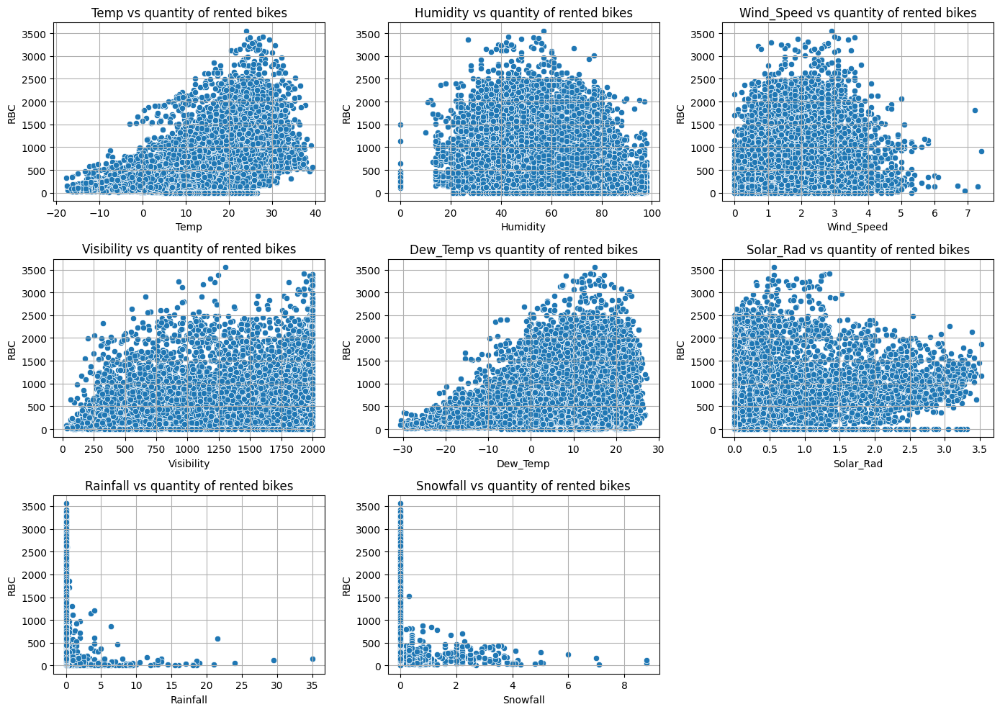

In [ ]:
# Визуализируем зависимости между количеством арендованных велосипедов и числовыми признаками
features = ['Temp', 'Humidity', 'Wind_Speed', 'Visibility',
            'Dew_Temp', 'Solar_Rad', 'Rainfall', 'Snowfall'
]
plt.figure(figsize=(14, 10))
for i, feature in enumerate(features):
    plt.subplot(3, 3, i+1)
    sns.scatterplot(data=data_bike, x=feature, y='RBC')
    plt.title(f'{feature} vs quantity of rented bikes')
    plt.grid(True)
plt.tight_layout()
plt.show()

Обратим внимание на скопление точек относительно осей абсцисс и ординат. Исходя из визуальзации скаттерплотов зависимостей целевой переменной с числовыми переменными можно сделать следующие выводы: в хорошую (благоприятную для езды) погоду количество арендованных вело увеличивается; переменные Rainfall и Snowfall для упрощения модели можно сделать бинарными, так как клиенты в основном арендуют вело при 0-ых значениях в данных переменных.

In [ ]:
# Проверим аренду вело во время нерабочих дней сервиса
data_bike.query('Func_Day == "No"')['RBC'].sum()

0

Отсюда можно сделать вывод, что переменная Func_Day не несёт значимой информации и никак не будет влиять на прогнозную силу модели. Её можно удалить. Также можно удалить строки, когда ни один вело не был взят в аренду, так как теряется смысл прогнозирования целевой переменной

In [ ]:
# Удаляем ненужную переменную и строки, которые не несут информации для прогноза
data_bike = data_bike.drop(['Func_Day'], axis=1)
data_bike.drop(data_bike.query('RBC == 0').index, inplace=True)

In [ ]:
data_bike.query('RBC == "0"').value_counts().sum()

0

In [ ]:
display(data_bike)

,Date,RBC,Hour,Temp,Humidity,Wind_Speed,Visibility,Dew_Temp,Solar_Rad,Rainfall,Snowfall,Seasons,Holiday
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday


### Работа с датой

In [ ]:
# Переведём дату в формат datetime
data_bike['Date'] = pd.to_datetime(data_bike['Date'], format='%d/%m/%Y')

In [ ]:
# Отделим дату от времени
data_bike['Year'] = data_bike['Date'].dt.year
data_bike['Month'] = data_bike['Date'].dt.month
data_bike['Day'] = data_bike['Date'].dt.day
data_bike['Weekday'] = data_bike['Date'].dt.weekday

In [ ]:
# Удалим дату, так как в исходном виде она больше не нужна
data_bike = data_bike.drop(['Date'], axis=1)

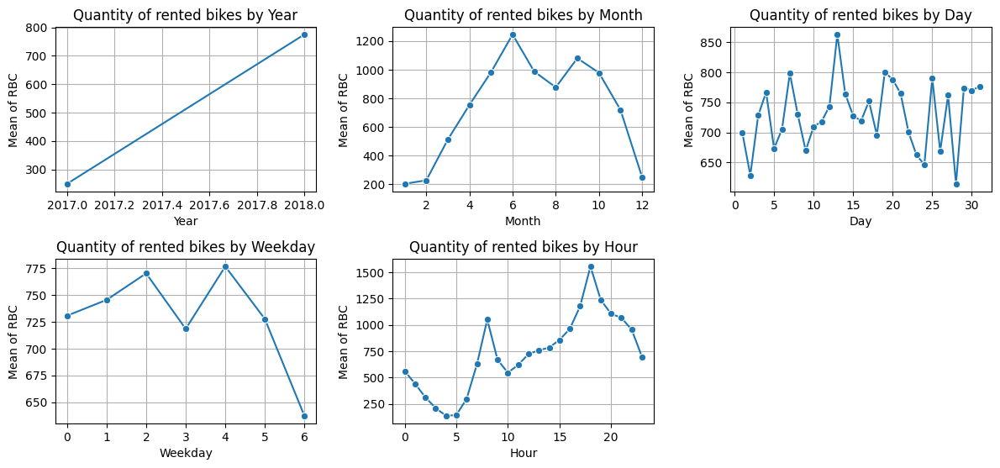

In [ ]:
# Визуализируем зависимости между количеством арендованных велосипедов по годам, месяцам и дням недели
features = ['Year', 'Month', 'Day', 'Weekday', 'Hour']
plt.figure(figsize=(12, 8))
for i, feature in enumerate(features):
    plt.subplot(3, 3, i+1)
    data_feature = data_bike.groupby(feature)['RBC'].mean().reset_index()
    sns.lineplot(data=data_feature, x=feature, y='RBC', marker='o')
    plt.title(f'Quantity of rented bikes by {feature}')
    plt.xlabel(feature)
    plt.ylabel('Mean of RBC')
    plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Проверка предоставленных данных по кол-ву арендованных велосипедов по представленным годам
rbc_2017 = data_bike.query('Year == 2017')['RBC'].count()
rbc_2018 = data_bike.query('Year == 2018')['RBC'].count()
print(f'Количество арендованных велосипедов в 2017 году: {rbc_2017}')
print(f'Количество арендованных велосипедов в 2018 году: {rbc_2018}')

Количество арендованных велосипедов в 2017 году: 744
Количество арендованных велосипедов в 2018 году: 7721


Судя по визуализации можно сделать выводы по каждому графику. **Среднее по годам** выражено неточно, так как данные даны преимущественно за 2018 год. **Среднее по месяцам** показывает повышение спроса на сервис в тёплые периоды года. После зимы идёт резкий пик аренды вело, потом следует просадка (возможно, период отпусков), далее опять подъём и затем спад из-за неблагоприятной погоды. **Среднее по дням месяца** показывает резкий скачок спроса аредны вело в середине месяца (возможно, период зарплат) и резкую просадку в конце месяца (также возможна связь с зарплатами), также заметны скачки спроса (связаны с рабочими и выходными). **Среднее по дням недели** показывает увеличение спроса сервиса в рабочие дни и уменьшение в выходные. И, наконец, **среднее по часам** показывает пиковое время спроса на сервис: утром люди едут по делам, вечером люди возвращаются по домам, минимальным спрос заметен в часы, когда большинство людей спит

### Работа с булевыми переменными

In [ ]:
# Проверим количество дней, когда были отмечены либо снег либо дождь
snowdays = data_bike.query('Snowfall != 0')['RBC'].count()
raindays = data_bike.query('Rainfall != 0')['RBC'].count()
print(f'Количество дней работы сервиса в дождь: {raindays}')
print(f'Количество дней работы сервиса в снег: {snowdays}')

Количество дней работы сервиса в дождь: 516
Количество дней работы сервиса в снег: 443


Отсюда принимаем решение сделать булевыми переменные Rainfall и Snowfall

In [ ]:
# Проверим количество дней, когда были отмечены праздничные дни
holidays = data_bike.query('Holiday == "Holiday"')['RBC'].count()
print('Количество дней, когда были отмечены праздничные дни: ', holidays)

Количество дней, когда были отмечены праздничные дни:  408


Аналогично принимаем решение сделать булевой переменную Holiday

In [ ]:
# Сделаем булевыми переменные Rainfall, Snowfall, Holiday
data_bike['Rainfall'] = data_bike['Rainfall'].astype('bool')
data_bike['Snowfall'] = data_bike['Snowfall'].astype('bool')
data_bike['Holiday'] = data_bike['Holiday'].map({'No Holiday': False, 'Holiday': True})

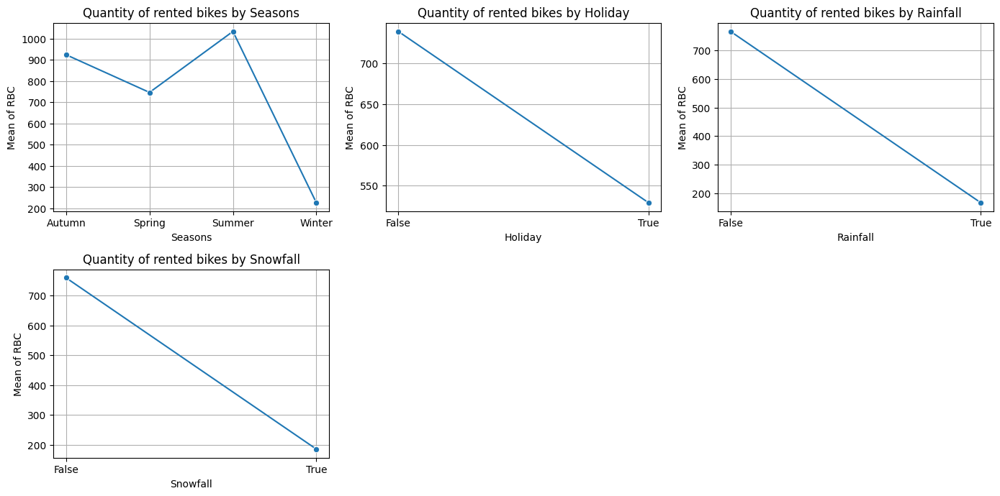

In [ ]:
# Визуализируем зависимости между количеством арендованных велосипедов и категориальными признаками
features = ['Seasons', 'Holiday', 'Rainfall', 'Snowfall']
x_ticks = {
    'Seasons': None,
    'Holiday': [False, True],
    'Rainfall': [False, True],
    'Snowfall' : [False, True]
}
plt.figure(figsize=(14, 10))
for i, feature in enumerate(features):
    plt.subplot(3, 3, i+1)
    data_feature = data_bike.groupby(feature)['RBC'].mean().reset_index()
    sns.lineplot(data=data_feature, x=feature, y='RBC', marker='o')
    plt.title(f'Quantity of rented bikes by {feature}')
    plt.xlabel(feature)
    plt.ylabel('Mean of RBC')
    plt.grid(True)
    if x_ticks[feature]:
        plt.xticks(ticks=range(len(x_ticks[feature])), labels=x_ticks[feature])
plt.tight_layout()
plt.show()

**Выводы** по визуализации спроса по категориальным признакам. Судя **по сезонам** сервис держит хороший спрос весной, летом и осенью. Зимой значительный спад, летом спрос наибольший. Сервис пользуется значительным спросом в хорошую погоду. Когда идут **дожди** или **снег**, велосипеды арендуют минимально. Также сервисом активно пользуются в рабочие дни, в **праздничные** дни спрос снижается

###Отбор признаков для построени модели

In [ ]:
data_bike.phik_matrix(interval_cols=data_bike.select_dtypes('number')).style.background_gradient(cmap = 'coolwarm')

,RBC,Hour,Temp,Humidity,Wind_Speed,Visibility,Dew_Temp,Solar_Rad,Rainfall,Snowfall,Seasons,Holiday,Year,Month,Day,Weekday
RBC,1.000000,0.621802,0.619933,0.328878,0.223270,0.264860,0.491661,0.476073,0.324203,0.310063,0.516791,0.126982,0.356752,0.568073,0.073415,0.062340
Hour,0.621802,1.000000,0.268404,0.502095,0.464493,0.183815,0.051958,0.724860,0.046863,0.040696,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Temp,0.619933,0.268404,1.000000,0.419250,0.246517,0.371043,0.892736,0.397278,0.202440,0.578632,0.813115,0.195646,0.595325,0.850329,0.309942,0.099542
Humidity,0.328878,0.502095,0.419250,1.000000,0.379299,0.594728,0.573059,0.485157,0.772048,0.124484,0.300713,0.105541,0.079197,0.401916,0.199790,0.129610
Wind_Speed,0.223270,0.464493,0.246517,0.379299,1.000000,0.201432,0.285859,0.366276,0.107943,0.121538,0.181557,0.070342,0.051749,0.223734,0.165173,0.097270
Visibility,0.264860,0.183815,0.371043,0.594728,0.201432,1.000000,0.424145,0.213938,0.382657,0.176378,0.224354,0.089667,0.168791,0.392998,0.234124,0.120385
Dew_Temp,0.491661,0.051958,0.892736,0.573059,0.285859,0.424145,1.000000,0.206302,0.285372,0.557358,0.794925,0.154418,0.488503,0.845171,0.412941,0.177366
Solar_Rad,0.476073,0.724860,0.397278,0.485157,0.366276,0.213938,0.206302,1.000000,0.189433,0.127214,0.218867,0.000000,0.180806,0.288903,0.054891,0.034893
Rainfall,0.324203,0.046863,0.202440,0.772048,0.107943,0.382657,0.285372,0.189433,1.000000,0.000000,0.187907,0.000000,0.051612,0.209200,0.093055,0.027791
Snowfall,0.310063,0.040696,0.578632,0.124484,0.121538,0.176378,0.557358,0.127214,0.000000,1.000000,0.504201,0.000000,0.352572,0.432537,0.208090,0.071376


Для выявления зависимостей между переменными был выбрал универсальный коэффициент корреляции **$\phi_k$**. Исходя из корреляционной матрицы можно сделать следующие выводы:

**Во-первых**, необходимо избавиться от переменной Year, данные в датасете представлены преимущественно за один год (2018)

**Во-вторых**, две переменные температуры Dew_Temp и Temp имеют мультиколлинеарностьи очень похожи между собой. От одной необходимо избавиться

**В-третьих**, две переменные Month и Seasons имеют мультиколлинеарность и очень похожи между собой. От одной необходимо избавиться

**В-четвёртых**, присутствует высокая корреляция между погодными признаками, с ней будем бороться с помощью регуляризации

In [ ]:
# Удалим ненужные столбцы
# Выбирая между удалением Seasons и Month, удалим переменную Month, чтобы поработать с кодированием переменной Seasons
# Также удалим столбец Dew_Temp, так как переменная Temp выглядит предпочтительнее
data_bike = data_bike.drop(['Year', 'Month', 'Dew_Temp'], axis=1)

In [ ]:
display(data_bike)

,RBC,Hour,Temp,Humidity,Wind_Speed,Visibility,Solar_Rad,Rainfall,Snowfall,Seasons,Holiday,Day,Weekday
0,254,0,-5.2,37,2.2,2000,0.0,False,False,Winter,False,1,4
1,204,1,-5.5,38,0.8,2000,0.0,False,False,Winter,False,1,4
2,173,2,-6.0,39,1.0,2000,0.0,False,False,Winter,False,1,4
3,107,3,-6.2,40,0.9,2000,0.0,False,False,Winter,False,1,4
4,78,4,-6.0,36,2.3,2000,0.0,False,False,Winter,False,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1003,19,4.2,34,2.6,1894,0.0,False,False,Autumn,False,30,4
8756,764,20,3.4,37,2.3,2000,0.0,False,False,Autumn,False,30,4
8757,694,21,2.6,39,0.3,1968,0.0,False,False,Autumn,False,30,4
8758,712,22,2.1,41,1.0,1859,0.0,False,False,Autumn,False,30,4


## Reporting DataFrames

In [ ]:
# Создадим DataFrame для отчета по кросс-валидациям и соответствующую функцию для работы с ним
cv_report_df = pd.DataFrame(columns=[
    'Model',
    'Train_score',
    'Train_time',
    'Valid_score',
    'Valid_time'
])

def add_to_cv_report(cv_report_df, model_name, train_score,
                  train_time, valid_score, valid_time
):
    new_entry = pd.DataFrame({
        'Model': [model_name],
        'Train_score': [train_score],
        'Train_time': [train_time],
        'Valid_score' : [valid_score],
        'Valid_time' : [valid_time]
})
    cv_report_df = pd.concat([cv_report_df, new_entry], ignore_index=True)
    return cv_report_df

In [ ]:
# Создадим DataFrame для отчета по ансамблям и соответствующую функцию для работы с ним
ensemble_report_df = pd.DataFrame(columns=[
    'Ensemble_model',
    'R2_test',
    'Adjusted_R2_test',
    'RMSE',
    'Time'
])

def add_to_ensemble_report(ensemble_report_df, ensemble_model, r2_test,
                  adjusted_r2_test, rmse, time
):
    new_entry = pd.DataFrame({
        'Ensemble_model': [ensemble_model],
        'R2_test': [r2_test],
        'Adjusted_R2_test': [adjusted_r2_test],
        'RMSE' : [rmse],
        'Time' : [time]
})
    ensemble_report_df = pd.concat([ensemble_report_df, new_entry], ignore_index=True)
    return ensemble_report_df

## Preprocessing

###Разделение данных

In [ ]:
# Разделим данные на признаки и целевую переменную
X = data_bike.drop(columns=['RBC'])
y = data_bike['RBC']

In [ ]:
# Разделим данные на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [ ]:
# Посмотрим на размеры выборок
print('Train: ', X_train.shape, y_train.shape)
print('Test: ', X_test.shape, y_test.shape)

Train:  (6348, 12) (6348,)
Test:  (2117, 12) (2117,)


###Создание Pipeline кодирования со стандартизацией

In [ ]:
# Кодируем признак Seasons и проведём стандартизацию данных, звернув это всё в пайплайн
# Также необходимо удалить одну переменную после кодирования, чтобы избежать мультиколлинеарности
# с этим поможет параметр drop='first'
preprocessor = make_column_transformer(
    (make_pipeline(OneHotEncoder(drop='first')), make_column_selector(dtype_include=object)),
    (make_pipeline(StandardScaler()), make_column_selector(dtype_include=['number', 'bool']))
)

##Baseline: LinearRegression

In [ ]:
# Построим базовую модель линейной регрессии и оценим её на кросс-валидации
base_model = make_pipeline(preprocessor, LinearRegression())
cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)

base_scores = cross_validate(base_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)

print('Mean R2 Train time:', round(np.sum(base_scores['fit_time']), 2))
print('Mean R2 Train score:', round(np.mean(base_scores['train_score']), 2))
print('Mean R2 Valid time:', round(np.sum(base_scores['score_time']), 2))
print('Mean R2 Valid score:', round(np.mean(base_scores['test_score']), 2))

Mean R2 Train time: 0.19
Mean R2 Train score: 0.56
Mean R2 Valid time: 0.05
Mean R2 Valid score: 0.56


In [ ]:
# Линейная регрессия - baseline
cv_report_df = add_to_cv_report(
    cv_report_df,
    'LinearRegression',
    round(np.mean(base_scores['train_score']), 2),
    round(np.sum(base_scores['fit_time']), 2),
    round(np.mean(base_scores['test_score']), 2),
    round(np.sum(base_scores['score_time']), 2)
)

###LinearRegression + Lasso

In [ ]:
# Проведём L1 регуляризацию Baseline модели
alpha_list = np.linspace(0, 2000, 30)
train_scores = []
valid_scores = []
for alpha in alpha_list:
  lasso_base_model = make_pipeline(preprocessor, Lasso(alpha=alpha))
  cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)
  lasso_base_scores = cross_validate(lasso_base_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)
  train_scores.append(round(np.mean(lasso_base_scores['train_score']), 2))
  valid_scores.append(round(np.mean(lasso_base_scores['test_score']), 2))

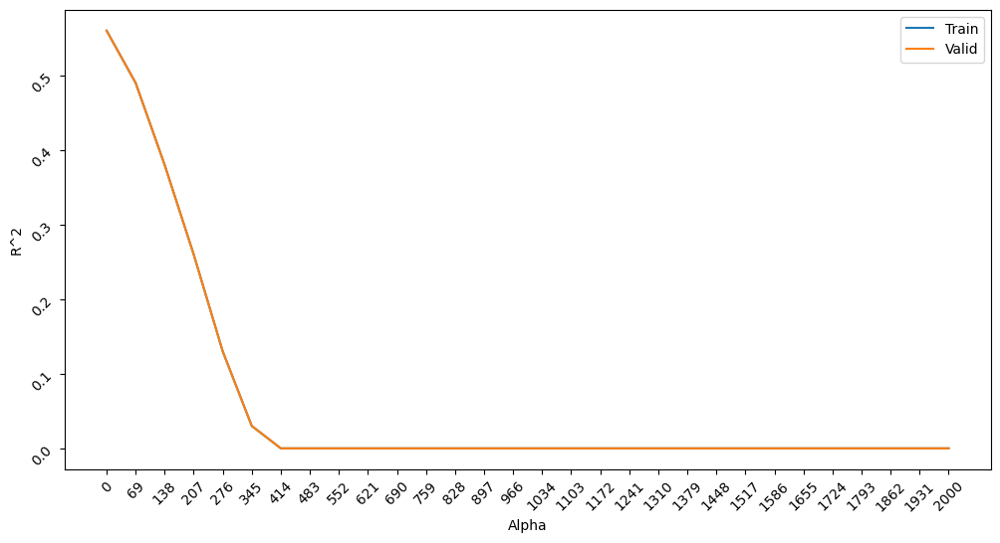

In [ ]:
# Визуализируем результат
plt.figure(figsize=(12, 6))
plt.plot(alpha_list, train_scores, label='Train')
plt.plot(alpha_list, valid_scores, label='Valid')
plt.xlabel('Alpha')
plt.ylabel('R^2')
plt.xticks(alpha_list)
plt.tick_params(rotation=45)
plt.legend()
plt.show()

L1 регуляризация базовой модели не принесла никакого результата

###LinearRegression + Ridge

In [ ]:
# Проведём L2 регуляризацию Baseline модели
alpha_list = np.linspace(0, 2000, 30)
train_scores = []
valid_scores = []
for alpha in alpha_list:
  ridge_base_model = make_pipeline(preprocessor, Ridge(alpha=alpha))
  cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)
  ridge_base_scores = cross_validate(ridge_base_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)
  train_scores.append(round(np.mean(ridge_base_scores['train_score']), 2))
  valid_scores.append(round(np.mean(ridge_base_scores['test_score']), 2))

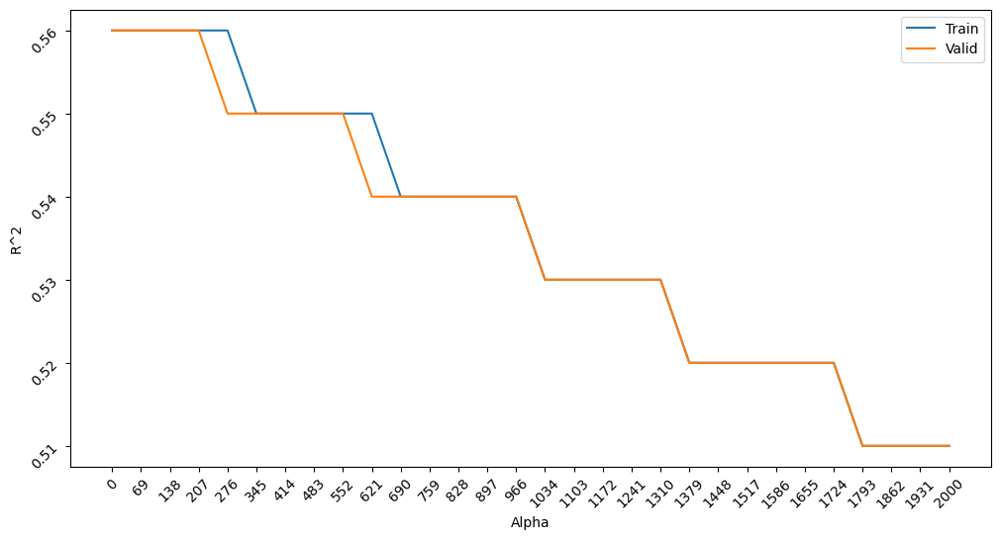

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(alpha_list, train_scores, label='Train')
plt.plot(alpha_list, valid_scores, label='Valid')
plt.xlabel('Alpha')
plt.ylabel('R^2')
plt.xticks(alpha_list)
plt.tick_params(rotation=45)
plt.legend()
plt.show()

L2 регуляризация базовой модели также не принесла никакого результата

##LinearRegression + PolynomialFeatures

###Полином второй степени

In [ ]:
# Добавим полиномов к базовой модели
poly_model = make_pipeline(preprocessor,
                           PolynomialFeatures(degree=2, include_bias=False),
                           LinearRegression()
)
cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)

poly_scores = cross_validate(poly_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)

print('Mean R2 Train time:', round(np.sum(poly_scores['fit_time']), 2))
print('Mean R2 Train score:', round(np.mean(poly_scores['train_score']), 2))
print('Mean R2 Valid time:', round(np.sum(poly_scores['score_time']), 2))
print('Mean R2 Valid score:', round(np.mean(poly_scores['test_score']), 2))

Mean R2 Train time: 0.53
Mean R2 Train score: 0.72
Mean R2 Valid time: 0.08
Mean R2 Valid score: 0.71


In [ ]:
# Полином второй степени линейной регрессии
cv_report_df = add_to_cv_report(
    cv_report_df,
    'LinearRegression + poly_2_degree',
    round(np.mean(poly_scores['train_score']), 2),
    round(np.sum(poly_scores['fit_time']), 2),
    round(np.mean(poly_scores['test_score']), 2),
    round(np.sum(poly_scores['score_time']), 2)
)

###Полином третьей степени

In [ ]:
# Добавим полиномов к базовой модели
poly_model = make_pipeline(preprocessor,
                           PolynomialFeatures(degree=3, include_bias=False),
                           LinearRegression()
)
cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)

poly_scores = cross_validate(poly_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)

print('Mean R2 Train time:', round(np.sum(poly_scores['fit_time']), 2))
print('Mean R2 Train score:', round(np.mean(poly_scores['train_score']), 2))
print('Mean R2 Valid time:', round(np.sum(poly_scores['score_time']), 2))
print('Mean R2 Valid score:', round(np.mean(poly_scores['test_score']), 2))

Mean R2 Train time: 5.25
Mean R2 Train score: 0.85
Mean R2 Valid time: 0.17
Mean R2 Valid score: -36211054279274.24


Увеличение степени полинома ухудшило метрику!

###Poly degree=2 + Lasso

In [ ]:
# Проведём L1 регуляризацию модели полинома второй степени
alpha_list = np.linspace(0, 2000, 30)
train_scores = []
valid_scores = []
for alpha in alpha_list:
  lasso_poly_model = make_pipeline(preprocessor,
                                   PolynomialFeatures(degree=2, include_bias=False),
                                   Lasso(alpha=alpha)
)
  cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)
  lasso_poly_scores = cross_validate(lasso_poly_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)
  train_scores.append(round(np.mean(lasso_poly_scores['train_score']), 2))
  valid_scores.append(round(np.mean(lasso_poly_scores['test_score']), 2))

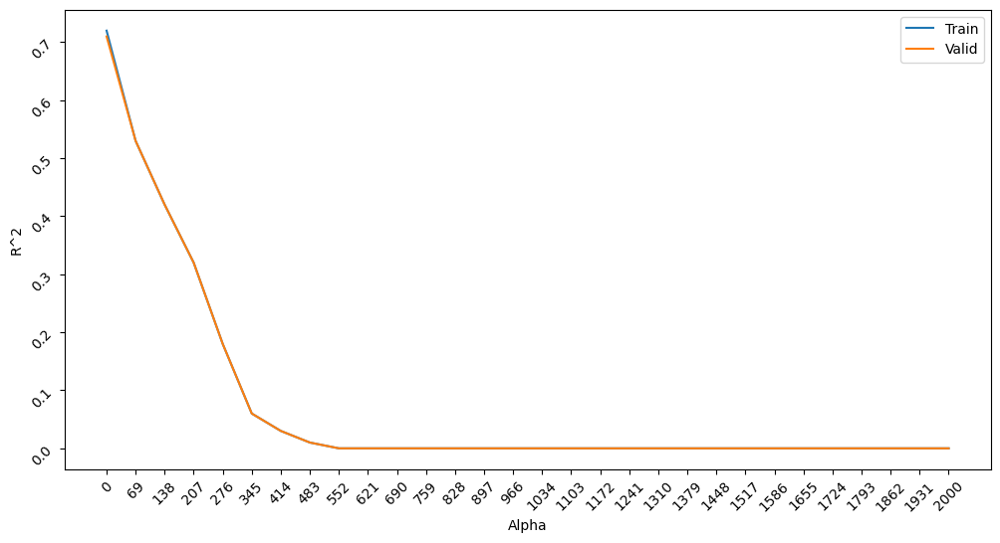

In [ ]:
# Визуализируем результат
plt.figure(figsize=(12, 6))
plt.plot(alpha_list, train_scores, label='Train')
plt.plot(alpha_list, valid_scores, label='Valid')
plt.xlabel('Alpha')
plt.ylabel('R^2')
plt.xticks(alpha_list)
plt.tick_params(rotation=45)
plt.legend()
plt.show()

L1 регуляризация модели полинома второй степени не принесла никакого результата

###Poly degree=2 + Ridge

In [ ]:
# Проведём L2 регуляризацию Baseline модели
alpha_list = np.linspace(0, 2000, 30)
train_scores = []
valid_scores = []
for alpha in alpha_list:
  ridge_poly_model = make_pipeline(preprocessor,
                                   PolynomialFeatures(degree=2, include_bias=False),
                                   Ridge(alpha=alpha)
)
  cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)
  ridge_poly_scores = cross_validate(ridge_poly_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)
  train_scores.append(round(np.mean(ridge_poly_scores['train_score']), 2))
  valid_scores.append(round(np.mean(ridge_poly_scores['test_score']), 2))

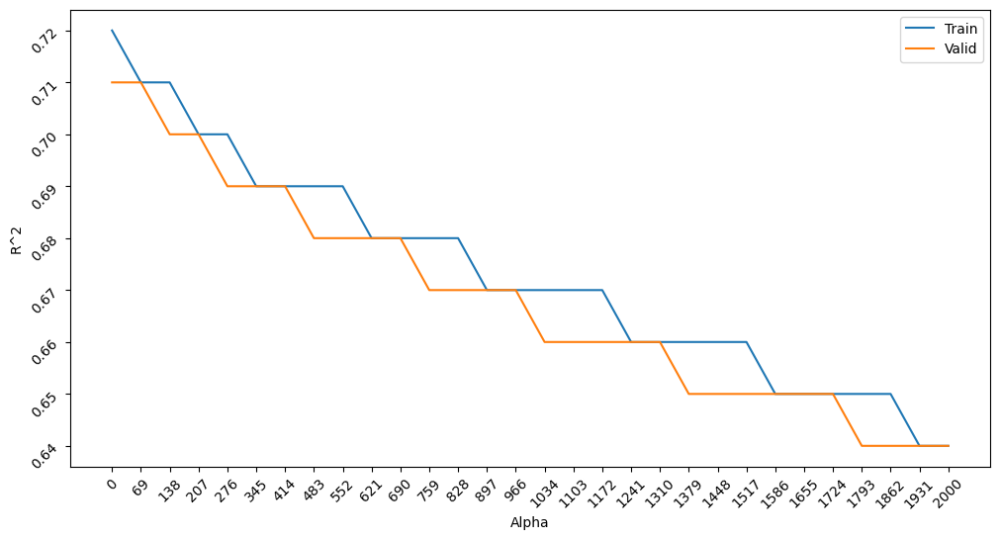

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(alpha_list, train_scores, label='Train')
plt.plot(alpha_list, valid_scores, label='Valid')
plt.xlabel('Alpha')
plt.ylabel('R^2')
plt.xticks(alpha_list)
plt.tick_params(rotation=45)
plt.legend()
plt.show()

L2 регуляризация модели полинома второй степени также не принесла никакого результата

##DecisionTreeRegressor

In [ ]:
# Построим модель дерева решений для линейной регрессии и оценим её на кросс-валидации
# Параметры DecisionTree пока подберём рандомно
dt_model = make_pipeline(preprocessor, DecisionTreeRegressor(
    criterion = 'squared_error',
    splitter = 'best',
    max_depth = 11,
    min_samples_split = 5,
    min_samples_leaf = 5,
    random_state = 42,
    max_features = 'auto'
))
cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)

dt_scores = cross_validate(dt_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)

print('Mean R2 Train time:', round(np.sum(dt_scores['fit_time']), 2))
print('Mean R2 Train score:', round(np.mean(dt_scores['train_score']), 2))
print('Mean R2 Valid time:', round(np.sum(dt_scores['score_time']), 2))
print('Mean R2 Valid score:', round(np.mean(dt_scores['test_score']), 2))

Mean R2 Train time: 0.21
Mean R2 Train score: 0.94
Mean R2 Valid time: 0.03
Mean R2 Valid score: 0.88


In [ ]:
# Дерево решений с рандомными гиперпараметрами
cv_report_df = add_to_cv_report(
    cv_report_df,
    'DecisionTreeRegressor',
    round(np.mean(dt_scores['train_score']), 2),
    round(np.sum(dt_scores['fit_time']), 2),
    round(np.mean(dt_scores['test_score']), 2),
    round(np.sum(dt_scores['score_time']), 2)
)

###DecisionTreeRegressor + GredSearchCV

In [ ]:
# Подберём гиперпараметры для модели дерева решений с помощью GridSearchCV
dt_model = make_pipeline(preprocessor, DecisionTreeRegressor(random_state=42))
cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)
dtree_params = {
    'decisiontreeregressor__criterion': ['squared_error', 'absolute_error'],
    'decisiontreeregressor__splitter': ['best', 'random'],
    'decisiontreeregressor__max_depth': range(4, 16),
    'decisiontreeregressor__min_samples_split': range(4, 16),
    'decisiontreeregressor__min_samples_leaf': range(4, 16),
    'decisiontreeregressor__max_features': ['auto', 'sqrt', 'log2']
}
dtree_grid = GridSearchCV(dt_model, dtree_params,
                          cv=cv, scoring='r2',
                          return_train_score=True, n_jobs=-1)

%time dtree_grid.fit(X_train, y_train)
print('Best R2 score:', round(dtree_grid.best_score_, 2))

CPU times: user 12min 38s, sys: 1min 22s, total: 14min 1s
Wall time: 8h 24min 27s
Best R2 score: 0.88


Невероятно долго, но ради практики очень хотелось. Опыт интересный!

In [ ]:
# Всего было перебрано 20736 комбинаций моделей
dtree_grid.cv_results_['rank_test_score'].size

20736

In [ ]:
# Наилучшая комбинация гиперпараметров
dtree_grid.best_params_

{'decisiontreeregressor__criterion': 'squared_error',
 'decisiontreeregressor__max_depth': 14,
 'decisiontreeregressor__max_features': 'auto',
 'decisiontreeregressor__min_samples_leaf': 4,
 'decisiontreeregressor__min_samples_split': 14,
 'decisiontreeregressor__splitter': 'best'}

Вывод по GridSearchCV: нарочно столкнулся с главной проблемой данного метода подбора гиперпараметров - занимает слишком много времени. Можно использовать альтернативу - RandomizedSearchCV. Только в этом методе из-за рандомного подбора можно пропустить оптимальную комбинацию. Восемь с половиной часов - это совершенно нецелесообразно и нерационально. Далее воспользуемся более продвинутой библиотекой подбора гиперпараметров - Hyperopt

##Bagging (bootstrap aggregating)

In [ ]:
# Реализуем ансамбль бэггинга с помощью случайного леса
# Параметры RandomForest пока подберём рандомно
rf_model = make_pipeline(preprocessor, RandomForestRegressor(
    n_estimators = 100,
    criterion = 'squared_error',
    max_depth = 11,
    min_samples_split = 5,
    min_samples_leaf = 5,
    random_state = 42,
    max_features = None
))
cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)

rf_scores = cross_validate(rf_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)

print('Mean R2 Train time:', round(np.sum(rf_scores['fit_time']), 2))
print('Mean R2 Train score:', round(np.mean(rf_scores['train_score']), 2))
print('Mean R2 Valid time:', round(np.sum(rf_scores['score_time']), 2))
print('Mean R2 Valid score:', round(np.mean(rf_scores['test_score']), 2))

Mean R2 Train time: 9.79
Mean R2 Train score: 0.95
Mean R2 Valid time: 0.12
Mean R2 Valid score: 0.91


In [ ]:
# Случайный лес с рандомными гиперпараметрами
cv_report_df = add_to_cv_report(
    cv_report_df,
    'Bagging(RandomForestRegressor)',
    round(np.mean(rf_scores['train_score']), 2),
    round(np.sum(rf_scores['fit_time']), 2),
    round(np.mean(rf_scores['test_score']), 2),
    round(np.sum(rf_scores['score_time']), 2)
)

In [ ]:
start_time = time.time()
# Обучаем модель на всех обучающих данных
rf_model.fit(X_train, y_train)

# Делаем предсказание на тесте
rf_model_pred = rf_model.predict(X_test)

# Оцениваем качество модели
r2_test =r2_score(y_test, rf_model_pred)
n_test = X_test.shape[0]
k_test = X_test.shape[1]
adjusted_r2_test = 1 - (1 - r2_test) * ((n_test - 1) / (n_test - k_test - 1))
end_time = time.time()

print('Время обучения модели:', round(end_time - start_time, 2), 'секунд')

print('R2 на тестовой выборке:', round(r2_test, 3))
print('Adjusted R2 на тестовой выборке:', round(adjusted_r2_test, 3))
print('RMSE на тестовой выборке:', round(np.sqrt(mean_squared_error(y_test, rf_model_pred)), 3))

Время обучения модели: 1.64 секунд
R2 на тестовой выборке: 0.905
Adjusted R2 на тестовой выборке: 0.904
RMSE на тестовой выборке: 194.165


In [ ]:
# Сделаем запись в отчётный DF по бэггингу
ensemble_report_df = add_to_ensemble_report(
    ensemble_report_df,
    'BaggingRegressor',
    round(r2_test, 3),
    round(adjusted_r2_test, 3),
    round(np.sqrt(mean_squared_error(y_test, rf_model_pred)), 3),
    round(end_time - start_time, 2)
)

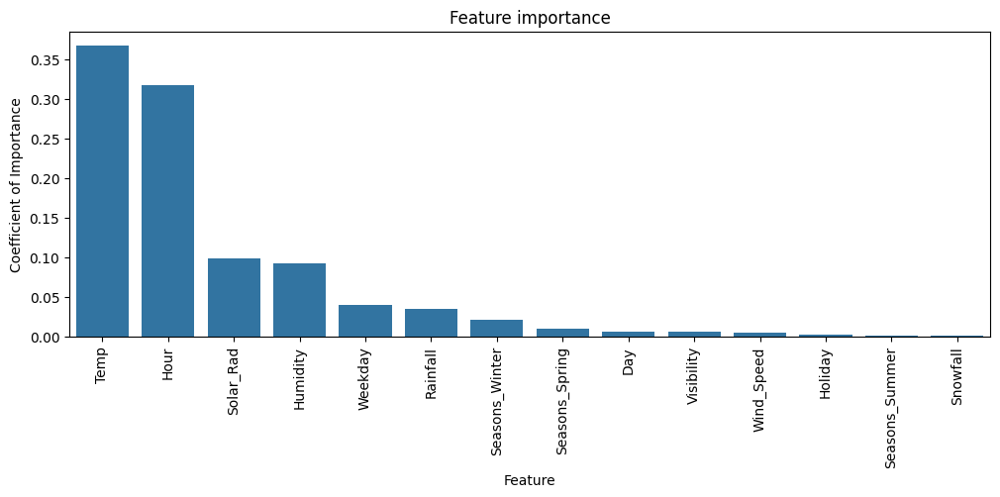

In [ ]:
# Визуализируем важность признаков с помощью Random Forest

# Для этого необходимо получить имена закодированных и стандартизированных признаков
ohe_transformer = rf_model.named_steps['columntransformer'].transformers_[0][1]
encoded_features = ohe_transformer.named_steps['onehotencoder'].get_feature_names_out()
scaled_features = X_train.select_dtypes(include=['number', 'bool']).columns
all_features = np.concatenate([encoded_features, scaled_features])

# Получаем важность признаков
feature_importances = rf_model.named_steps['randomforestregressor'].feature_importances_

# Создаем DataFrame из признаков и их важности
features_df = pd.DataFrame({'Feature': all_features, 'Importance': feature_importances})

# Сортируем DataFrame по важности признаков
features_df = features_df.sort_values(by='Importance', ascending=False)

# Запускаем визуализацию
plt.figure(figsize=(12, 4))
sns.barplot(x='Feature', y='Importance', data=features_df)
plt.title('Feature importance')
plt.ylabel('Coefficient of Importance')
plt.xlabel('Feature')
plt.xticks(rotation=90)
plt.show()

Исходя из визуализации выделим шесть наиболее важных признаков, которые влияют на модель: Temp, Hour, Solar_Rad, Humidity, Weekday, Rainfall

###RandomForestregresson + Hyperopt

In [ ]:
# Подберём гиперпараметры для модели случайного леса с помощью Hyperopt

# Создадим пайплайн с препроцессором и моделью случайного леса
rf_model = make_pipeline(preprocessor, RandomForestRegressor(random_state = 42))
# Зададим пространство поиска гиперпараметров
space = {
    'randomforestregressor__n_estimators': hp.choice('n_estimators', range(100, 501)),
    'randomforestregressor__max_depth': hp.choice('max_depth', range(1, 22)),
    'randomforestregressor__min_samples_split': hp.choice('min_samples_split', range(2, 22)),
    'randomforestregressor__min_samples_leaf': hp.choice('min_samples_leaf', range(1, 22)),
    'randomforestregressor__max_features': hp.choice('max_features', [None, 'sqrt', 'log2']),
    'randomforestregressor__criterion': hp.choice('criterion', ['squared_error', 'absolute_error',
                                             'poisson', 'friedman_mse'])
}

# Зададим функцию для подбора гиперпараметров
def objective(params, pipeline, X_train, y_train):
  # params - словарь с гиперпараметрами
  # pipeline - пайплайн
  # X_train - обучающая выборка
  # y_train - целевая переменная
  # return - средняя точность на кросс-валидации

  # Задаем модель
  pipeline.set_params(**params)
  # Задаем кросс-валидацию
  cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)
  # Запускаем кросс-валидацию
  scores = cross_validate(pipeline, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True,
                             n_jobs=-1
)
# Возвращаем результаты, которые записываются в Trials
  return {'loss': -np.mean(scores['test_score']), 'params': params, 'status': STATUS_OK}


In [ ]:
# Создадим объект для хранения результатов
trials = Trials()

# Зададим функцию для подбора гиперпараметров с периодическим сохранением состояния
def run_hyperopt(max_evals):
    for i in range(0, max_evals, 25):
      best = fmin(
        fn=partial(objective, pipeline=rf_model, X_train=X_train, y_train=y_train),
        space=space,
        algo=tpe.suggest,
        max_evals=i+25,
        trials=trials,
        show_progressbar=True
)
      # Сохранение текущего состояния trials в файл каждые 25 итераций
      # Для этого используем библиотеку pickle, которая позволяет сохранять данные в файл
      with open('trials.pkl', 'wb') as f:
          pickle.dump(trials, f)
    return best

# Запуск подбора гиперпараметров
%time best = run_hyperopt(max_evals=100)

print("Лучшие параметры:", best)

100%|██████████| 100/100 [40:04<00:00, 96.19s/trial, best loss: -0.9261278151191471]
CPU times: user 41.7 s, sys: 8.73 s, total: 50.5 s
Wall time: 1h 59min 8s
Лучшие параметры: {'criterion': 3, 'max_depth': 19, 'max_features': 0, 'min_samples_leaf': 1, 'min_samples_split': 1, 'n_estimators': 164}


Как показала практика: когда я не разбивал итерации циклом, например, по 25 штук, а давал программе полное значение, например, 100, времени на подбор уходило гораздо больше. Также отмечу, что на практике понял, что лучше сохранять состояние переменной Trials, мало ли произойдёт какой-либо сбой рабочей среды. Чтобы не начинать подбор сначала, можно загрузиться с файла с последнего сохранения.

Важно: если пространство поиска задано функцией hp.choice, то на выходе мы получим индексы лучших параметров

Библиотека Hyperopt доказала свою продвинутость в сравнении с GridSearchCV


In [ ]:
# Проведём кросс-валидацию модели бэггинга на подобранных гиперпараметрах
rf_best_model = make_pipeline(preprocessor, RandomForestRegressor(
      n_estimators = 264,
      criterion = 'friedman_mse',
      max_depth = 20,
      min_samples_split = 3,
      min_samples_leaf = 2,
      random_state = 42,
      max_features = None
))
cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)

rf_best_scores = cross_validate(rf_best_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)

print('Mean R2 Train time:', round(np.sum(rf_best_scores['fit_time']), 2))
print('Mean R2 Train score:', round(np.mean(rf_best_scores['train_score']), 2))
print('Mean R2 Valid time:', round(np.sum(rf_best_scores['score_time']), 2))
print('Mean R2 Valid score:', round(np.mean(rf_best_scores['test_score']), 2))

Mean R2 Train time: 34.63
Mean R2 Train score: 0.98
Mean R2 Valid time: 0.41
Mean R2 Valid score: 0.93


In [ ]:
# Случайный лес с лучшими гиперпараметрами
cv_report_df = add_to_cv_report(
    cv_report_df,
    'Bagging(RandomForestRegressor) + Hyperopt',
    round(np.mean(rf_best_scores['train_score']), 2),
    round(np.sum(rf_best_scores['fit_time']), 2),
    round(np.mean(rf_best_scores['test_score']), 2),
    round(np.sum(rf_best_scores['score_time']), 2)
)

In [ ]:
start_time = time.time()
# Обучаем модель на всех обучающих данных
rf_best_model.fit(X_train, y_train)

# Делаем предсказание на тесте
rf_best_model_pred = rf_best_model.predict(X_test)

# Оцениваем качество модели
r2_test =r2_score(y_test, rf_best_model_pred)
n_test = X_test.shape[0]
k_test = X_test.shape[1]
adjusted_r2_test = 1 - (1 - r2_test) * ((n_test - 1) / (n_test - k_test - 1))
end_time = time.time()

print('Время обучения модели:', round(end_time - start_time, 2), 'секунд')

print('R2 на тестовой выборке:', round(r2_test, 3))
print('Adjusted R2 на тестовой выборке:', round(adjusted_r2_test, 3))
print('RMSE на тестовой выборке:', round(np.sqrt(mean_squared_error(y_test, rf_best_model_pred)), 3))

Время обучения модели: 5.61 секунд
R2 на тестовой выборке: 0.919
Adjusted R2 на тестовой выборке: 0.919
RMSE на тестовой выборке: 178.65


In [ ]:
# Сделаем запись в отчётный DF по бэггингу с лучшими гиперпараметрами
ensemble_report_df = add_to_ensemble_report(
    ensemble_report_df,
    'BaggingRegressor + Hyperopt',
    round(r2_test, 3),
    round(adjusted_r2_test, 3),
    round(np.sqrt(mean_squared_error(y_test, rf_best_model_pred)), 3),
    round(end_time - start_time, 2)
)

##Stacking

In [ ]:
# Попробуем применить метод ансамблирования - стэкинг
# Определим базовые модели ансамбля в список кортежей
# В качестве гиперпараметров для каждой модели возьмём лучшие из подборов выше
models = [
    ('LinearRegression', LinearRegression()),
    ('DecisionTree', DecisionTreeRegressor(
        criterion = 'squared_error',
        max_depth = 14,
        max_features = 'auto',
        min_samples_leaf = 4,
        min_samples_split = 14,
        splitter = 'best',
        random_state=42
)),
    ('RandomForest', RandomForestRegressor(
        n_estimators = 264,
        criterion = 'friedman_mse',
        max_depth = 20,
        min_samples_split = 3,
        min_samples_leaf = 2,
        random_state = 42,
        max_features = None
))
]
# Зададим мета-модель
meta_model = LinearRegression()

# Зададим кросс-валидацию
cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)

# Создадим пайплайн с препроцессором и моделью стэкинга
stacking = make_pipeline(preprocessor,
                         StackingRegressor(estimators=models,
                                           final_estimator=meta_model,
                                           cv=cv, n_jobs=-1)
)

stacking_scores = cross_validate(stacking, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)
print('Mean R2 Train time:', round(np.sum(stacking_scores['fit_time']), 2))
print('Mean R2 Train score:', round(np.mean(stacking_scores['train_score']), 2))
print('Mean R2 Valid time:', round(np.sum(stacking_scores['score_time']), 2))
print('Mean R2 Valid score:', round(np.mean(stacking_scores['test_score']), 2))

Mean R2 Train time: 186.51
Mean R2 Train score: 0.98
Mean R2 Valid time: 0.48
Mean R2 Valid score: 0.93


In [ ]:
# Стэкинг с лучшими гиперпараметрами из подборов
cv_report_df = add_to_cv_report(
    cv_report_df,
    'StackingRegressor',
    round(np.mean(stacking_scores['train_score']), 2),
    round(np.sum(stacking_scores['fit_time']), 2),
    round(np.mean(stacking_scores['test_score']), 2),
    round(np.sum(stacking_scores['score_time']), 2)
)

In [ ]:
start_time = time.time()
# Обучим модель на всех обучающих данных и сделаем предсказание
stacking.fit(X_train, y_train)
stacking_pred = stacking.predict(X_test)

# Оцениваем качество модели
r2_test =r2_score(y_test, stacking_pred)
n_test = X_test.shape[0]
k_test = X_test.shape[1]
adjusted_r2_test = 1 - (1 - r2_test) * ((n_test - 1) / (n_test - k_test - 1))
end_time = time.time()

print('R2 на тестовой выборке:', round(r2_test, 3))
print('Adjusted R2 на тестовой выборке:', round(adjusted_r2_test, 3))
print('RMSE на тестовой выборке:', round(np.sqrt(mean_squared_error(y_test, stacking_pred)), 3))

R2 на тестовой выборке: 0.919
Adjusted R2 на тестовой выборке: 0.919
RMSE на тестовой выборке: 178.572


In [ ]:
# Сделаем запись в отчётный DF по стэкингу
ensemble_report_df = add_to_ensemble_report(
    ensemble_report_df,
    'StackingRegressor',
    round(r2_test, 3),
    round(adjusted_r2_test, 3),
    round(np.sqrt(mean_squared_error(y_test, stacking_pred)), 3),
    round(end_time - start_time, 2)
)

##Boosting

In [ ]:
# Попробуем применить метод ансамблирования - бустинг
# Параметры пока подберём рандомно
gb_model = make_pipeline(preprocessor, GradientBoostingRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=4,
    subsample=0.8,
    min_samples_split=3,
    min_samples_leaf=2,
    max_features='sqrt',
    random_state=42
))

# Зададим кросс-валидацию
cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)

gb_scores = cross_validate(gb_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)

print('Mean R2 Train time:', round(np.sum(gb_scores['fit_time']), 2))
print('Mean R2 Train score:', round(np.mean(gb_scores['train_score']), 2))
print('Mean R2 Valid time:', round(np.sum(gb_scores['score_time']), 2))
print('Mean R2 Valid score:', round(np.mean(gb_scores['test_score']), 2))

Mean R2 Train time: 3.53
Mean R2 Train score: 0.89
Mean R2 Valid time: 0.07
Mean R2 Valid score: 0.86


In [ ]:
# Бустинг с рандомными гиперпараметрами
cv_report_df = add_to_cv_report(
    cv_report_df,
    'GradientBoostingRegressor',
    round(np.mean(gb_scores['train_score']), 2),
    round(np.sum(gb_scores['fit_time']), 2),
    round(np.mean(gb_scores['test_score']), 2),
    round(np.sum(gb_scores['score_time']), 2)
)

In [ ]:
start_time = time.time()
# Обучим модель на всех обучающих данных и сделаем предсказание
gb_model.fit(X_train, y_train)
gb_pred = gb_model.predict(X_test)

# Оцениваем качество модели
r2_test =r2_score(y_test, gb_pred)
n_test = X_test.shape[0]
k_test = X_test.shape[1]
adjusted_r2_test = 1 - (1 - r2_test) * ((n_test - 1) / (n_test - k_test - 1))
end_time = time.time()

print('R2 на тестовой выборке:', round(r2_test, 3))
print('Adjusted R2 на тестовой выборке:', round(adjusted_r2_test, 3))
print('RMSE на тестовой выборке:', round(np.sqrt(mean_squared_error(y_test, gb_pred)), 3))

R2 на тестовой выборке: 0.865
Adjusted R2 на тестовой выборке: 0.864
RMSE на тестовой выборке: 230.701


In [ ]:
# Сделаем запись в отчётный DF по бустингу
ensemble_report_df = add_to_ensemble_report(
    ensemble_report_df,
    'GradientBoostingRegressor',
    round(r2_test, 3),
    round(adjusted_r2_test, 3),
    round(np.sqrt(mean_squared_error(y_test, gb_pred)), 3),
    round(end_time - start_time, 2)
)

###GradientBoostingRegressor + Hyperopt

In [ ]:
# Подберём гиперпараметры для ансамбля бустинга с помощью Hyperopt

# Создадим пайплайн с препроцессором и моделью GradientBoostingRegressor
gb_model = make_pipeline(preprocessor, GradientBoostingRegressor(random_state = 42))
# Зададим пространство поиска гиперпараметров
space = {
    'gradientboostingregressor__n_estimators': hp.choice('n_estimators', range(50, 351)),
    'gradientboostingregressor__learning_rate':  hp.uniform('learning_rate', 0.01, 1.1),
    'gradientboostingregressor__max_depth': hp.choice('max_depth', range(1, 9)),
    'gradientboostingregressor__subsample': hp.uniform('subsample', 0.5, 1.0),
    'gradientboostingregressor__criterion': hp.choice('criterion', ['friedman_mse', 'squared_error']),
    'gradientboostingregressor__min_samples_split': hp.choice('min_samples_split', range(2, 9)),
    'gradientboostingregressor__min_samples_leaf': hp.choice('min_samples_leaf', range(1, 9)),
    'gradientboostingregressor__max_features': hp.choice('max_features', [None, 'sqrt', 'log2'])
}

# Зададим функцию для подбора гиперпараметров
def objective(params, pipeline, X_train, y_train):
  # params - словарь с гиперпараметрами
  # pipeline - пайплайн
  # X_train - обучающая выборка
  # y_train - целевая переменная
  # return - средняя точность на кросс-валидации

  # Задаем модель
  pipeline.set_params(**params)
  # Задаем кросс-валидацию
  cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)
  # Запускаем кросс-валидацию
  scores = cross_validate(pipeline, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True,
                             n_jobs=-1
)
# Возвращаем результаты, которые записываются в Trials
  return {'loss': -np.mean(scores['test_score']), 'params': params, 'status': STATUS_OK}

In [ ]:
# Создадим объект для хранения результатов
trials = Trials()

# Зададим функцию для подбора гиперпараметров с периодическим сохранением состояния
def run_hyperopt(max_evals):
    for i in range(0, max_evals, 25):
      best = fmin(
        fn=partial(objective, pipeline=gb_model, X_train=X_train, y_train=y_train),
        space=space,
        algo=tpe.suggest,
        max_evals=i+25,
        trials=trials,
        show_progressbar=True
)
      # Сохранение текущего состояния trials в файл каждые 25 итераций
      # Для этого используем библиотеку pickle, которая позволяет сохранять данные в файл
      with open('trials.pkl', 'wb') as f:
          pickle.dump(trials, f)
    return best

# Запуск подбора гиперпараметров
%time best = run_hyperopt(max_evals=100)

print("Лучшие параметры:", best)

100%|██████████| 100/100 [04:08<00:00,  9.93s/trial, best loss: -0.9474981808168909]
CPU times: user 12.6 s, sys: 1.34 s, total: 13.9 s
Wall time: 12min 43s
Лучшие параметры: {'criterion': 1, 'learning_rate': 0.08515689914577215, 'max_depth': 7, 'max_features': 0, 'min_samples_leaf': 0, 'min_samples_split': 3, 'n_estimators': 115, 'subsample': 0.9409192998401079}


In [ ]:
# Проведём кросс-валидацию модели бустинга на подобранных гиперпараметрах
gb_best_model = make_pipeline(preprocessor, GradientBoostingRegressor(
    n_estimators=165,
    learning_rate=0.08515689914577215,
    max_depth=8,
    subsample=0.9409192998401079,
    criterion='squared_error',
    min_samples_split=5,
    min_samples_leaf=1,
    max_features=None,
    random_state=42
))

cv = StratifiedKFold(n_splits=7, shuffle = True, random_state=42)

gb_best_scores = cross_validate(gb_best_model, X_train,
                             y_train, cv=cv,
                             scoring='r2', return_train_score=True
)

print('Mean R2 Train time:', round(np.sum(gb_best_scores['fit_time']), 2))
print('Mean R2 Train score:', round(np.mean(gb_best_scores['train_score']), 2))
print('Mean R2 Valid time:', round(np.sum(gb_best_scores['score_time']), 2))
print('Mean R2 Valid score:', round(np.mean(gb_best_scores['test_score']), 2))

Mean R2 Train time: 26.14
Mean R2 Train score: 1.0
Mean R2 Valid time: 0.13
Mean R2 Valid score: 0.95


In [ ]:
# Бустинг с подобранными гиперпараметрами
cv_report_df = add_to_cv_report(
    cv_report_df,
    'GradientBoostingRegressor + Hyperopt',
    round(np.mean(gb_best_scores['train_score']), 2),
    round(np.sum(gb_best_scores['fit_time']), 2),
    round(np.mean(gb_best_scores['test_score']), 2),
    round(np.sum(gb_best_scores['score_time']), 2)
)

In [ ]:
start_time = time.time()
# Обучаем модель на всех обучающих данных
gb_best_model.fit(X_train, y_train)
gb_best_model_train = gb_best_model.predict(X_train)
# Делаем предсказание на тесте
gb_best_model_pred = gb_best_model.predict(X_test)

# Оцениваем качество модели
r2_test =r2_score(y_test, gb_best_model_pred)
n_test = X_test.shape[0]
k_test = X_test.shape[1]
adjusted_r2_test = 1 - (1 - r2_test) * ((n_test - 1) / (n_test - k_test - 1))
end_time = time.time()

print('Время обучения модели:', round(end_time - start_time, 2), 'секунд')

print('R2 на тестовой выборке:', round(r2_test, 3))
print('Adjusted R2 на тестовой выборке:', round(adjusted_r2_test, 3))
print('RMSE на тестовой выборке:', round(np.sqrt(mean_squared_error(y_test, gb_best_model_pred)), 3))

Время обучения модели: 3.93 секунд
R2 на тестовой выборке: 0.937
Adjusted R2 на тестовой выборке: 0.936
RMSE на тестовой выборке: 158.156


In [ ]:
# Сделаем запись в отчётный DF по бустингу с лучшими гиперпараметрами
ensemble_report_df = add_to_ensemble_report(
    ensemble_report_df,
    'GradientBoostingRegressor + Hyperopt',
    round(r2_test, 3),
    round(adjusted_r2_test, 3),
    round(np.sqrt(mean_squared_error(y_test, gb_best_model_pred)), 3),
    round(end_time - start_time, 2)
)

##Final Report

In [ ]:
print('Отчёт по кросс-валидациям')
display(cv_report_df)

Отчёт по кросс-валидациям


,Model,Train_score,Train_time,Valid_score,Valid_time
0,LinearRegression,0.56,0.19,0.56,0.05
1,LinearRegression + poly_2_degree,0.72,0.53,0.71,0.08
2,DecisionTreeRegressor,0.94,0.21,0.88,0.03
3,Bagging(RandomForestRegressor),0.95,9.79,0.91,0.12
4,Bagging(RandomForestRegressor) + Hyperopt,0.98,34.63,0.93,0.41
5,StackingRegressor,0.98,186.51,0.93,0.48
6,GradientBoostingRegressor,0.89,3.53,0.86,0.07
7,GradientBoostingRegressor + Hyperopt,1.00,20.24,0.95,0.09


In [ ]:
print('Выбор наилучшей модели по метрике Adjusted_R2')
display(ensemble_report_df.sort_values(by='Adjusted_R2_test', ascending=False))

Выбор наилучшей модели по метрике Adjusted_R2


,Ensemble_model,R2_test,Adjusted_R2_test,RMSE,Time
4,GradientBoostingRegressor + Hyperopt,0.937,0.936,158.156,3.26
1,BaggingRegressor + Hyperopt,0.919,0.919,178.650,5.61
2,StackingRegressor,0.919,0.919,178.572,30.98
0,BaggingRegressor,0.905,0.904,194.165,1.64
3,GradientBoostingRegressor,0.865,0.864,230.701,0.61


###Residual distribution

<Axes: xlabel='RBC', ylabel='Count'>

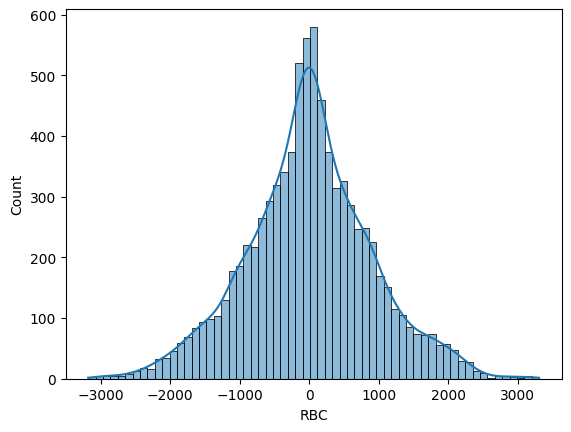

In [ ]:
# Посмотрим на распределение остатков для выбранной оптимальной модели
y_pred = np.concatenate((gb_best_model_train, gb_best_model_pred))
sns.histplot((y-y_pred), kde=True)

Вывод: остатки распределены нормальным распределением. Значит выбранная модель хорошо соответствует данным и ее предсказания достаточно точны и надежны.


**Итоговый вывод:**

- В качестве наилучшей модели прогнозирования возьмём **GradientBoostingRegressor** с подбором гиперпараметров с помощью **Hyperopt**

- **Adjusted_r2** на тесте выдал метрику **0.936** при **RMSE=158.156**

- Факторы, которые больше всего влияют на спрос велосипедов: **Temp, Hour, Solar_Rad, Humidity, Weekday, Rainfall**

- Спрос на велосипеды растёт в хорошую погоду и в часы рабочих дней, когда наблюдается высокий трафик (часы пик)